In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier , GradientBoostingClassifier
from sklearn.metrics import accuracy_score , confusion_matrix , precision_score , recall_score
from sklearn.metrics import average_precision_score
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_log_error
from sklearn.neural_network import MLPClassifier
# from xgboost import XGBClassifier
# import xgboost as xgb
from sklearn.preprocessing import PowerTransformer
from pandas import read_csv

df=pd.read_csv("F:\\ML project\\DryBeanDataset\\DryBeanDataset\\Dry_Bean_Dataset.csv")


In [2]:
df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [3]:
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860154,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


In [4]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [5]:
#Data Cleaning step
df=df.dropna(axis=0)

In [6]:
df['Class'].value_counts()

DERMASON    3546
SIRA        2636
SEKER       2027
HOROZ       1928
CALI        1630
BARBUNYA    1322
BOMBAY       522
Name: Class, dtype: int64

In [7]:
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860154,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


<AxesSubplot:>

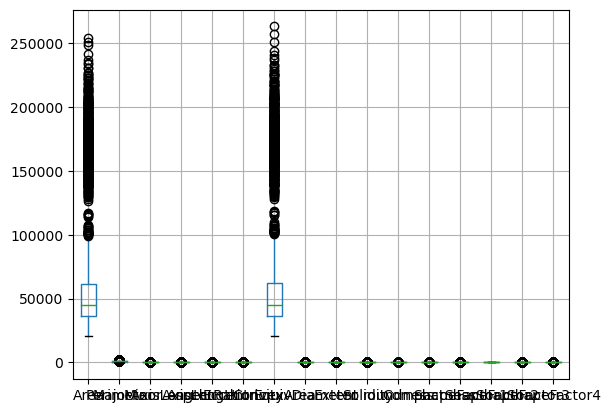

In [8]:
df.boxplot()

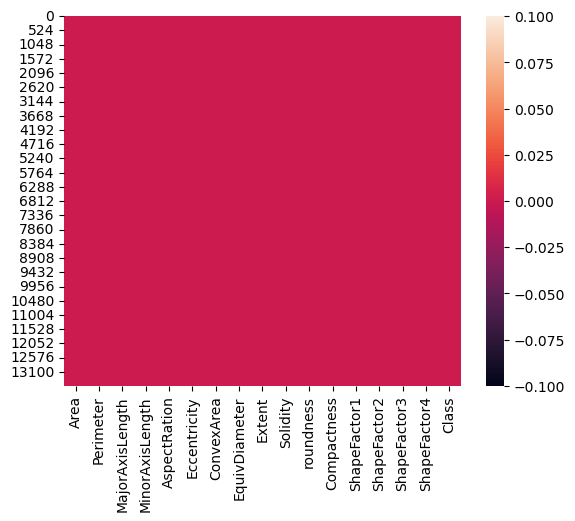

In [9]:
sns.heatmap(df.isnull())
plt.show()

In [10]:
df.Class.value_counts()

DERMASON    3546
SIRA        2636
SEKER       2027
HOROZ       1928
CALI        1630
BARBUNYA    1322
BOMBAY       522
Name: Class, dtype: int64

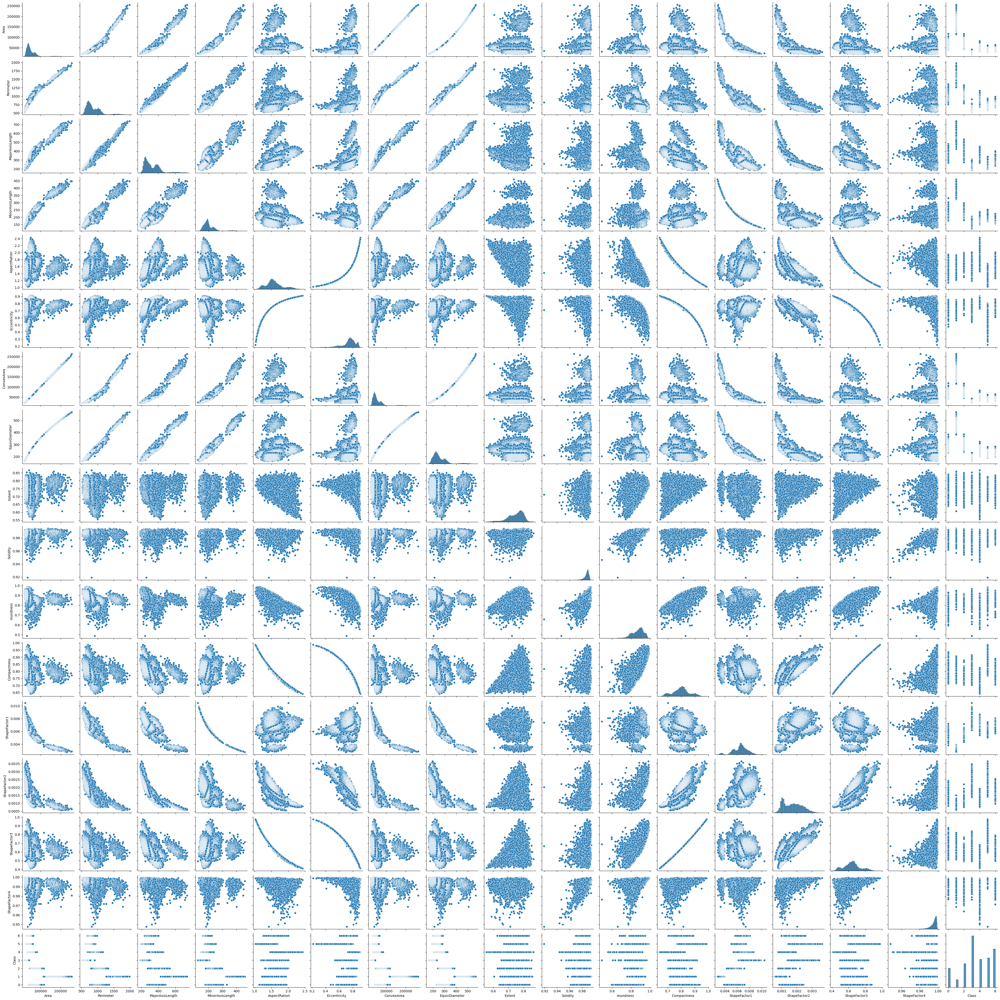

In [11]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df.Class=le.fit_transform(df.Class)
sns.pairplot(data=df)
plt.show()

In [12]:
df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,5
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,5
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,5
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,5
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,5


In [13]:
print(le.classes_)

['BARBUNYA' 'BOMBAY' 'CALI' 'DERMASON' 'HOROZ' 'SEKER' 'SIRA']


In [14]:
df.Class.value_counts()

3    3546
6    2636
5    2027
4    1928
2    1630
0    1322
1     522
Name: Class, dtype: int64

In [15]:
df=df.sample(frac=1)  # gives random sample of items
df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
8730,44546,787.039,293.828936,193.864590,1.515640,0.751452,45117,238.154842,0.773301,0.987344,0.903704,0.810522,0.006596,0.001756,0.656946,0.995694,6
1718,44737,765.217,264.975800,215.264062,1.230934,0.583113,45101,238.664864,0.785135,0.991929,0.960080,0.900704,0.005923,0.002405,0.811268,0.998618,5
9090,46137,804.134,301.858498,195.156389,1.546752,0.762900,46601,242.370487,0.774111,0.990043,0.896607,0.802927,0.006543,0.001677,0.644693,0.997179,6
9386,47677,834.119,313.966143,194.114849,1.617425,0.785968,48354,246.382308,0.779265,0.985999,0.861118,0.784742,0.006585,0.001540,0.615819,0.996042,6
7239,62877,977.534,391.133465,205.399362,1.904258,0.851017,63528,282.944310,0.730864,0.989753,0.826871,0.723396,0.006221,0.001051,0.523302,0.996501,4


# SVM

In [16]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.svm import SVC


In [17]:
D=df.values
X=D[:,0:16]
y=D[:,16]
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2)

In [18]:
np.set_printoptions(edgeitems=127)
from sklearn.preprocessing import StandardScaler  
stdscaler=StandardScaler()  # used to standardised the data
X_train=stdscaler.fit_transform(X_train)
X_test=stdscaler.transform(X_test)
X_train

array([[-6.36895251e-01, -8.32829553e-01, -8.76494253e-01,
        -5.18616586e-01, -8.63916204e-01, -7.28354397e-01,
        -6.37905803e-01, -7.41233557e-01,  1.61597783e-01,
         2.75420068e-01,  1.17005440e+00,  8.69422689e-01,
         5.00318044e-01,  1.03455899e+00,  8.57357161e-01,
         7.23278034e-01],
       [ 4.32521776e-01,  1.34480286e+00,  3.71380368e-01,
         7.96361995e-01, -4.23089720e-01, -1.52937928e-01,
         4.55692972e-01,  6.11747226e-01,  7.16093552e-01,
        -2.36768365e+00, -4.05946098e+00,  3.53092658e-01,
        -1.06955353e+00, -3.49370399e-01,  3.18331095e-01,
         7.76901408e-01],
       [-7.79927592e-01, -9.67906643e-01, -9.09189565e-01,
        -9.53920306e-01, -2.57051008e-01,  2.38373575e-02,
        -7.78703817e-01, -9.63545837e-01, -3.29136905e-01,
        -7.96810486e-02,  5.14834090e-01,  1.54522428e-01,
         1.29228373e+00,  6.80831237e-01,  1.16493820e-01,
         1.47455953e-01],
       [-3.91182692e-01, -3.83083442e

In [19]:
y_train

array([3., 0., 3., 3., 0., 3., 6., 3., 3., 2., 3., 3., 0., 3., 4., 5., 4.,
       0., 3., 4., 4., 5., 2., 6., 3., 3., 6., 5., 2., 3., 3., 0., 6., 2.,
       3., 3., 2., 5., 0., 3., 0., 2., 3., 4., 3., 6., 6., 0., 4., 2., 3.,
       0., 6., 6., 3., 0., 3., 3., 0., 2., 3., 3., 4., 5., 0., 0., 3., 4.,
       3., 4., 6., 4., 5., 5., 0., 6., 2., 2., 4., 6., 3., 6., 5., 5., 3.,
       2., 1., 6., 0., 3., 3., 6., 0., 2., 2., 0., 3., 1., 2., 2., 5., 6.,
       2., 4., 3., 3., 6., 0., 6., 5., 3., 5., 3., 6., 4., 4., 4., 0., 6.,
       0., 5., 4., 0., 5., 3., 3., 4., ..., 3., 6., 3., 4., 5., 4., 6.,
       6., 6., 5., 2., 0., 2., 3., 0., 4., 6., 1., 3., 2., 6., 2., 3., 0.,
       4., 4., 2., 1., 4., 1., 4., 3., 4., 6., 6., 3., 3., 3., 4., 3., 5.,
       0., 5., 2., 1., 5., 4., 6., 6., 5., 5., 3., 3., 2., 3., 6., 0., 5.,
       4., 3., 3., 6., 5., 3., 5., 0., 3., 0., 5., 5., 5., 3., 6., 3., 4.,
       6., 3., 3., 4., 3., 3., 2., 6., 2., 3., 5., 4., 2., 4., 0., 6., 2.,
       3., 3., 3., 6., 5., 6

In [20]:
model1=SVC(C=10,kernel='rbf', gamma=0.1)
model1.fit(X_train,y_train)

SVC(C=10, gamma=0.1)

In [21]:
predict=model1.predict(X_test)
print(accuracy_score(y_test,predict))
print(mean_absolute_error(y_test,predict))

0.9386705839147998
0.15791406536907823


In [22]:
model1.score(X_test,y_test)

0.9386705839147998

In [23]:
# SVC with poly kernel

In [24]:
model1p=SVC(C=10,kernel='poly', gamma=0.1)
model1p.fit(X_train,y_train)

SVC(C=10, gamma=0.1, kernel='poly')

In [25]:
predict=model1p.predict(X_test)
print(accuracy_score(y_test,predict))

0.9327947117150202


              precision    recall  f1-score   support

         0.0       0.95      0.93      0.94       254
         1.0       1.00      1.00      1.00       113
         2.0       0.93      0.96      0.95       314
         3.0       0.94      0.92      0.93       747
         4.0       0.97      0.95      0.96       375
         5.0       0.94      0.95      0.94       398
         6.0       0.87      0.90      0.89       522

    accuracy                           0.93      2723
   macro avg       0.94      0.94      0.94      2723
weighted avg       0.93      0.93      0.93      2723



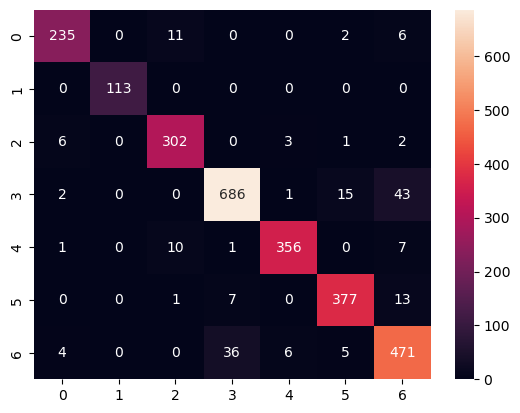

In [26]:
cm=pd.DataFrame(confusion_matrix(y_test, predict))
sns.heatmap(cm, annot=True, fmt='d')
print(classification_report(y_test, predict))
plt.show()

# Logistic 

In [27]:
from sklearn.model_selection import train_test_split
D=df.values
X=D[:,0:16]
y=D[:,16]
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2)



In [28]:
from sklearn.linear_model import LogisticRegression
model=LogisticRegression(C=10)

In [29]:
from sklearn.preprocessing import StandardScaler
stdscalar=StandardScaler()
X_train=stdscalar.fit_transform(X_train)
X_test=stdscalar.transform(X_test)


In [30]:
model.fit(X_train,y_train)

f:\anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(C=10)

In [31]:
model.score(X_test, y_test)

0.9309585016525891

In [32]:
model.predict([[8.45744247e-01,  1.01356535e+00,  1.19160001e+00,
         7.80959591e-01,  7.93504216e-01,  8.28968742e-01,
         8.45363212e-01,  1.04353957e+00,  2.01034093e-02,
        -2.09372872e-01, -3.91214350e-01, -8.83611440e-01,
        -1.00515993e+00, -1.14635998e+00, -8.89802718e-01,
        -1.53809109e+00]])

array([2.])

In [33]:
predictions=model.predict(X_test)
accuracy_score(y_test,predictions)

0.9309585016525891

              precision    recall  f1-score   support

         0.0       0.94      0.92      0.93       254
         1.0       1.00      1.00      1.00        96
         2.0       0.92      0.95      0.93       322
         3.0       0.93      0.92      0.93       721
         4.0       0.96      0.95      0.96       426
         5.0       0.96      0.97      0.96       376
         6.0       0.88      0.88      0.88       528

    accuracy                           0.93      2723
   macro avg       0.94      0.94      0.94      2723
weighted avg       0.93      0.93      0.93      2723



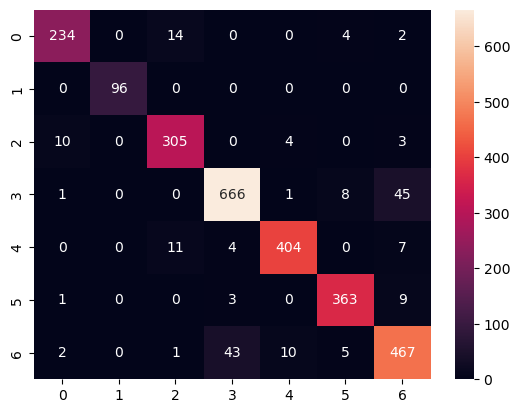

In [34]:
cm=pd.DataFrame(confusion_matrix(y_test, predictions))
sns.heatmap(cm, annot=True, fmt='d')
print(classification_report(y_test, predictions))
plt.show()

# Decision Tree

In [35]:
from sklearn.model_selection import train_test_split

In [36]:
D=df.values
X=D[:,0:16]
y=D[:,16]
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2)

In [37]:
from sklearn.preprocessing import StandardScaler
stdscalar=StandardScaler()
X_train=stdscalar.fit_transform(X_train)
X_test=stdscalar.transform(X_test)

In [38]:
from sklearn.tree import DecisionTreeClassifier
dtree=DecisionTreeClassifier()
dtree.fit(X_train,y_train)

DecisionTreeClassifier()

In [39]:
pred_dtree=dtree.predict(X_test)
accuracy_score(y_test,pred_dtree)


0.9037825927286082

              precision    recall  f1-score   support

         0.0       0.89      0.91      0.90       254
         1.0       0.99      1.00      1.00       107
         2.0       0.93      0.91      0.92       314
         3.0       0.91      0.90      0.90       758
         4.0       0.93      0.92      0.93       375
         5.0       0.94      0.94      0.94       381
         6.0       0.82      0.84      0.83       534

    accuracy                           0.90      2723
   macro avg       0.92      0.92      0.92      2723
weighted avg       0.90      0.90      0.90      2723



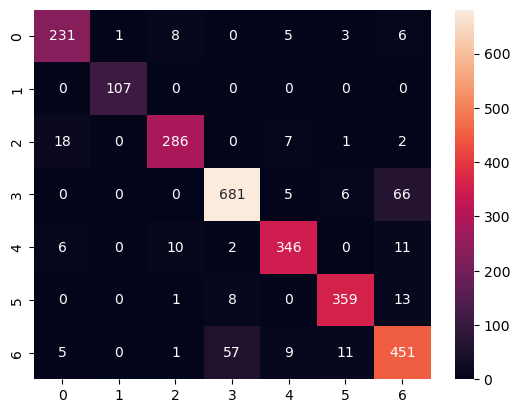

In [40]:
cm=pd.DataFrame(confusion_matrix(y_test, pred_dtree))
sns.heatmap(cm, annot=True, fmt='d')
print(classification_report(y_test, pred_dtree))
plt.show()

In [41]:
print("Mean Absolute error of logistic regression",mean_absolute_error(y_test,pred_dtree))

Mean Absolute error of logistic regression 0.25633492471538744


# Random forest

In [42]:
from sklearn.ensemble import RandomForestClassifier
rfe=RandomForestClassifier()
rfe.fit(X_train,y_train)

RandomForestClassifier()

In [43]:
pred_rfe=rfe.predict(X_test)
accuracy_score(y_test,pred_rfe)

0.932427469702534

In [44]:
print("mean absolute error",mean_absolute_error(y_test,pred_rfe))

mean absolute error 0.18178479618068308


              precision    recall  f1-score   support

         0.0       0.93      0.93      0.93       254
         1.0       0.99      1.00      1.00       107
         2.0       0.96      0.93      0.94       314
         3.0       0.92      0.95      0.93       758
         4.0       0.96      0.95      0.95       375
         5.0       0.97      0.95      0.96       381
         6.0       0.89      0.87      0.88       534

    accuracy                           0.93      2723
   macro avg       0.94      0.94      0.94      2723
weighted avg       0.93      0.93      0.93      2723



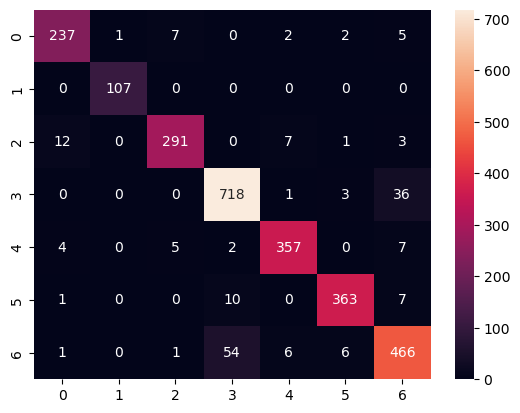

In [45]:
con=pd.DataFrame(confusion_matrix(y_test, pred_rfe))
sns.heatmap(con, annot=True, fmt='d')
print(classification_report(y_test, pred_rfe))
plt.show()

# Naive Bayes Classifier


In [50]:
from sklearn.naive_bayes import GaussianNB
# train the classifier 
gnb=GaussianNB()
gnb.fit(X_train,y_train)

GaussianNB()

In [52]:
pred_nb=gnb.predict(X_test)
accuracy_score(y_test,pred_nb)

0.9052515607785531

              precision    recall  f1-score   support

         0.0       0.90      0.81      0.85       254
         1.0       0.98      1.00      0.99       107
         2.0       0.86      0.91      0.89       314
         3.0       0.93      0.89      0.91       758
         4.0       0.95      0.96      0.96       375
         5.0       0.95      0.95      0.95       381
         6.0       0.82      0.88      0.85       534

    accuracy                           0.91      2723
   macro avg       0.91      0.91      0.91      2723
weighted avg       0.91      0.91      0.91      2723



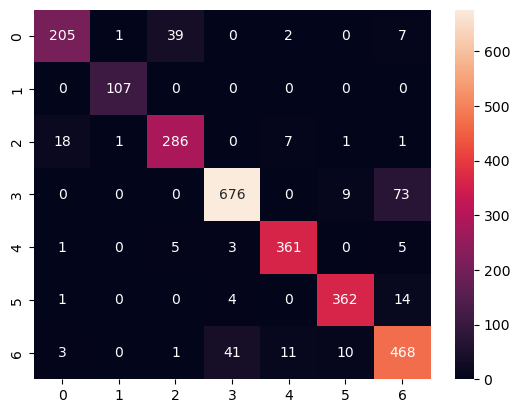

In [54]:
conm=pd.DataFrame(confusion_matrix(y_test, pred_nb))
sns.heatmap(conm, annot=True, fmt='d')
print(classification_report(y_test, pred_nb))
plt.show()

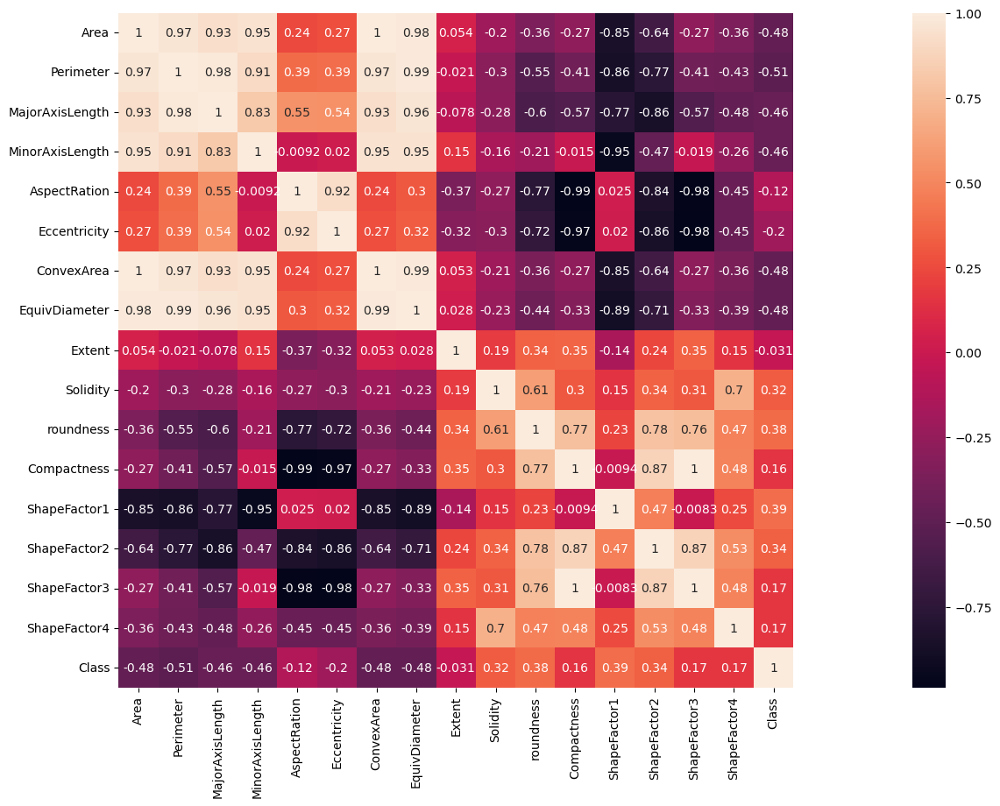

In [46]:
plt.figure(figsize=(35,10))
corrmat=df.corr()
sns.heatmap(corrmat, square=True, annot=True)
plt.show()

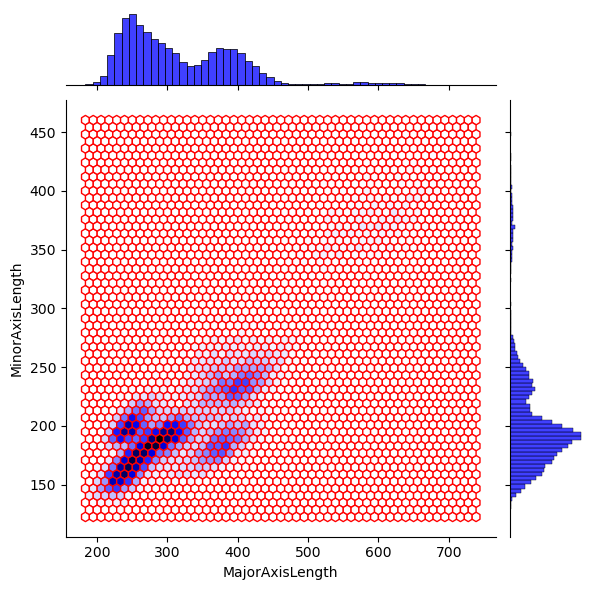

In [47]:
sns.jointplot(x='MajorAxisLength',y='MinorAxisLength',data=df,kind='hex',dropna=True,color="blue",edgecolor="red")
plt.show()

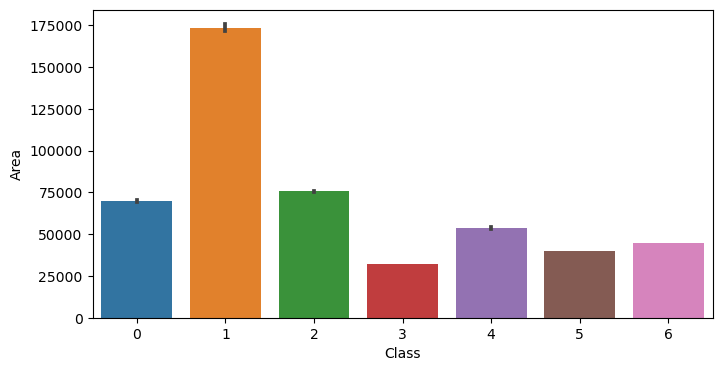

In [48]:
plt.figure(figsize=(8,4))
sns.barplot(x='Class',y='Area',data=df)
plt.show()

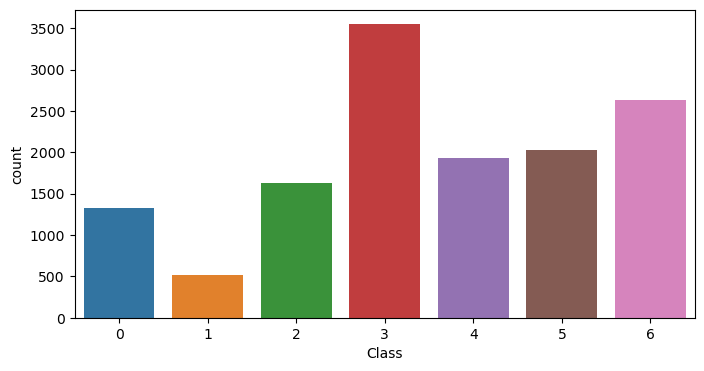

In [49]:
plt.figure(figsize=(8,4))
sns.countplot(x='Class',data=df)
plt.show()